<a href="https://colab.research.google.com/github/adele9244/Projet_Machine_Learning/blob/main/ProjetMachineLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#   **Predicting Residential Property Prices in King County, Washington, Using Supervised Machine Learning**

---



***How can we predict the selling price of a house in Washington State based on its characteristics?***

# **Introduction**

**Business Case :**
Real estate is a dynamic and complex sector, where determining an accurate sale or purchase price is crucial for all stakeholders: buyers, sellers, agents, and financial institutions. King County in Washington, which includes the city of Seattle, is particularly relevant due to its rapid growth and significant market fluctuations.

The main objective of this project is to build a supervised machine learning model to predict the final sale price of a house in this region. This prediction will make it possible to:

- Quickly and objectively assess the market value of a home

- Identify undervalued or overvalued properties, providing a strategic advantage to investors

This project falls squarely within the field of finance/economics or data analysis, and its success will be measured by the accuracy of the price predictions.

# **Step 1 : Preparation and analysis**

- Importing and loading libraries (pandas, numpy, etc.)
- Importing datasets
- Creation of the final dataset

In [245]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
import numpy as np


The dataset **HousePricingData** contains detailed information about 21,613 residential properties, providing a rich foundation for analyzing housing market trends and developing predictive models for real estate prices.

Each observation represents a single property sold, with variables describing its structural characteristics, location, and transaction details.

**General Information**

- id — A unique identifier assigned to each property record
- date — The sale date of the property

**Price Details**
- price — The sale price of the property (target variable). It reflects the market value at the time of sale and serves as the dependent variable in predictive models.

**Property Features**
- bedrooms — Total number of bedrooms in the property.
- bathrooms — Number of bathrooms, including partial bathrooms represented as fractions (e.g., 1.5 for one full and one half bathroom).
- sqft_living — Interior living area measured in square feet, representing the usable floor space inside the home.
- sqft_lot — Total lot area in square feet, including both the building and surrounding land.
- floors — Number of floors (levels) in the building.
- waterfront — Binary indicator specifying whether the property offers a waterfront view (Y/N).
- view — Quality score assessing the view from the property, with higher values indicating more desirable or scenic views.
- condition — Overall condition of the property based on maintenance and preservation (e.g., poor, average, excellent).
- grade — Construction and design quality grade, on a scale typically ranging from 1 to 13 (higher = better materials and finishes).

**Additional Metrics**
- sqft_above — Square footage of the house above ground level, excluding any basement area.
- sqft_basement — Square footage of the basement area, if present.
- yr_built — The year the property was originally constructed.
- yr_renovated — The year of the most recent renovation; 0 or missing values indicate no renovation.

**Location Coordinates**
- zipcode — The ZIP code identifying the property’s geographic area.
- lat — Latitude coordinate of the property location.
- long — Longitude coordinate of the property location.

**Neighbor Comparisons**
- sqft_living15 — Average living area (in square feet) of the 15 nearest neighboring properties, offering a measure of neighborhood housing size.
- sqft_lot15 — Average lot area (in square feet) of the 15 nearest neighboring properties, providing insight into local land use density.

In [246]:
HousePricingData=pd.read_csv('HousePrincingDataset.csv', sep=";")
print(HousePricingData.head())
print(HousePricingData.columns)

           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00         1180   
1  6414100192  20141209T000000  538000.0         3       2.25         2570   
2  5631500400  20150225T000000  180000.0         2       1.00          770   
3  2487200875  20141209T000000  604000.0         4       3.00         1960   
4  1954400510  20150218T000000  510000.0         3       2.00         1680   

   sqft_lot  floors waterfront  view  ... grade  sqft_above  sqft_basement  \
0      5650     1.0          N     0  ...     7        1180              0   
1      7242     2.0          N     0  ...     7        2170            400   
2     10000     1.0          N     0  ...     6         770              0   
3      5000     1.0          N     0  ...     7        1050            910   
4      8080     1.0          N     0  ...     8        1680              0   

   yr_built  yr_renovated  zipcode      lat     long  sqft_liv

We also downloaded the dataset **zipcodes** in order to add the names of the cities from our HousePricingData dataset. This dataset contains the list of all the zipcodes in the US and there city name.

Since different zipcodes can refer to the same city, this added column is going to provide us with a more high level overview of the price variations in different areas.

In [247]:
zipcodes=pd.read_csv('us_zips.csv', sep=";")
print(zipcodes.head())

     zip        city   state state_abbr          county  count_code  latitude  \
0  99553      Akutan  Alaska         AK  Aleutians East          13   54.1430   
1  99571    Cold Bay  Alaska         AK  Aleutians East          13   55.1858   
2  99583  False Pass  Alaska         AK  Aleutians East          13   54.8410   
3  99612   King Cove  Alaska         AK  Aleutians East          13   55.0628   
4  99661  Sand Point  Alaska         AK  Aleutians East          13   55.3192   

   longitude  
0  -165.7854  
1  -162.7211  
2  -163.4368  
3  -162.3056  
4  -160.4914  


In [248]:
zipcodes_for_merge = zipcodes[['zip', 'city']].copy()

data_merged = pd.merge(HousePricingData,zipcodes_for_merge,left_on='zipcode',right_on='zip',how='inner')
data_merged.drop(columns=['zip'], inplace=True)

print("Aperçu du DataFrame fusionné:")
print(data_merged.head())
print("Nouvelles colonnes du dataset:")
print(data_merged.columns)

Aperçu du DataFrame fusionné:
           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00         1180   
1  6414100192  20141209T000000  538000.0         3       2.25         2570   
2  5631500400  20150225T000000  180000.0         2       1.00          770   
3  2487200875  20141209T000000  604000.0         4       3.00         1960   
4  1954400510  20150218T000000  510000.0         3       2.00         1680   

   sqft_lot  floors waterfront  view  ... sqft_above  sqft_basement  yr_built  \
0      5650     1.0          N     0  ...       1180              0      1955   
1      7242     2.0          N     0  ...       2170            400      1951   
2     10000     1.0          N     0  ...        770              0      1933   
3      5000     1.0          N     0  ...       1050            910      1965   
4      8080     1.0          N     0  ...       1680              0      1987   

   yr_renovate

For each house sale we calculated the price per sqft it was sold to. We put this value in the column **sqft_price_per_house_calculated**.

In [249]:
data_merged['sqft_price_per_house_calculated']=data_merged['price']/data_merged['sqft_living']
data_merged.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,city,sqft_price_per_house_calculated
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,N,0,...,0,1955,0,98178,47.5112,-122.257,1340,5650,Seattle,188.050847
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,N,0,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,Seattle,209.338521
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,N,0,...,0,1933,0,98028,47.7379,-122.233,2720,8062,Kenmore,233.766234
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,N,0,...,910,1965,0,98136,47.5208,-122.393,1360,5000,Seattle,308.163265
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,N,0,...,0,1987,0,98074,47.6168,-122.045,1800,7503,Sammamish,303.571429


For each of the 70 different zipcodes we search the median listing home price per square feet. We used the website https://www.realtor.com/realestateandhomes-search/98117/overview and listed our values in a new file called **HousePrincingDataset_prix.csv**.

This dataset allows us to evaluate if the houses in our initial dataset were sold at prices above or under market prices.

However, these values are prices in 2025, whereas our initial dataset is from 2015. The prices are therefore not yet comparable.


In [250]:
data_price2025=pd.read_csv('HousePrincingDataset_prix.csv', sep=";")
print(data_price2025.head())

   zipcode       City  sqft_price
0    98178    Seattle         401
1    98125    Seattle         486
2    98028    Kenmore         495
3    98136    Seattle         534
4    98074  Sammamish         633


In [251]:
data_price2025.rename(columns={'sqft_price': 'med_sqft_price2025_byzip_online'}, inplace=True)

In [252]:
df_final= pd.merge(data_merged,data_price2025[['zipcode', 'med_sqft_price2025_byzip_online']], left_on='zipcode', right_on='zipcode', how='left')

#Vérification
print("Aperçu du DataFrame fusionné (df_merged) :")
print(df_final.head())
print("\nListe des colonnes :")
print(df_final.columns)

Aperçu du DataFrame fusionné (df_merged) :
           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00         1180   
1  6414100192  20141209T000000  538000.0         3       2.25         2570   
2  5631500400  20150225T000000  180000.0         2       1.00          770   
3  2487200875  20141209T000000  604000.0         4       3.00         1960   
4  1954400510  20150218T000000  510000.0         3       2.00         1680   

   sqft_lot  floors waterfront  view  ... yr_built  yr_renovated  zipcode  \
0      5650     1.0          N     0  ...     1955             0    98178   
1      7242     2.0          N     0  ...     1951          1991    98125   
2     10000     1.0          N     0  ...     1933             0    98028   
3      5000     1.0          N     0  ...     1965             0    98136   
4      8080     1.0          N     0  ...     1987             0    98074   

       lat     long  sqft

In [253]:
med_sqft_price2015_byzip_calculated=df_final.groupby('zipcode')['sqft_price_per_house_calculated'].median().reset_index()

med_sqft_price2015_byzip_calculated.rename(
    columns={'sqft_price_per_house_calculated': 'med_sqft_price2015_byzip_calculated'},
    inplace=True
)
df_final = pd.merge(df_final, med_sqft_price2015_byzip_calculated, on='zipcode', how='left')


print("New columns :")
print(df_final.columns)
print(df_final.head())

New columns :
Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'city',
       'sqft_price_per_house_calculated', 'med_sqft_price2025_byzip_online',
       'med_sqft_price2015_byzip_calculated'],
      dtype='object')
           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00         1180   
1  6414100192  20141209T000000  538000.0         3       2.25         2570   
2  5631500400  20150225T000000  180000.0         2       1.00          770   
3  2487200875  20141209T000000  604000.0         4       3.00         1960   
4  1954400510  20150218T000000  510000.0         3       2.00         1680   

   sqft_lot  floors waterfront  view  ... yr_renovated  zipcode      lat  \
0      5650   

According to the Federal Reserve Bank of St Louis (https://fred.stlouisfed.org/series/ATNHPIUS53033A), the average house sale price in King County, Washington, was multiplied by 1.989 between 2015 and 2025.

In order to know the median price/sqft of each zipcode in 2015, we divide the value we have for 2025 by 1.989.

In [254]:
df_final['med_sqft_price2015_byzip_online']=df_final['med_sqft_price2025_byzip_online']/1.989
print(df_final.head())

           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00         1180   
1  6414100192  20141209T000000  538000.0         3       2.25         2570   
2  5631500400  20150225T000000  180000.0         2       1.00          770   
3  2487200875  20141209T000000  604000.0         4       3.00         1960   
4  1954400510  20150218T000000  510000.0         3       2.00         1680   

   sqft_lot  floors waterfront  view  ... zipcode      lat     long  \
0      5650     1.0          N     0  ...   98178  47.5112 -122.257   
1      7242     2.0          N     0  ...   98125  47.7210 -122.319   
2     10000     1.0          N     0  ...   98028  47.7379 -122.233   
3      5000     1.0          N     0  ...   98136  47.5208 -122.393   
4      8080     1.0          N     0  ...   98074  47.6168 -122.045   

   sqft_living15  sqft_lot15       city  sqft_price_per_house_calculated  \
0           1340        5650

# **Step 2 : Data Pre-processing:**
- Management of outliers (aberrant values).

- Encoding of categorical variables (e.g., waterfront, postcode).

- Scaling of numerical variables (e.g., sqft_living).

- Separation into training/test sets (train-test split).

We transform our categorical variables into numerical ones in order to be able to apply different formulas and algorithms.
- For **waterfront** if there is, it's 1 if there is none, it's 0.
- For **condition**, it goes from poor (1) to very good (5).

We therefore add the columns  conditions_num and waterfront_num for the numerical values.


In [255]:
unique_values_condition = df_final['condition'].unique()
print(unique_values_condition)

['Average' 'Very Good' 'Good' 'Poor' 'Fair']


After adding all the columns we need, we extract the data into a new csv file.


In [256]:
condition_mapping = {
    'Poor': 1,
    'Fair': 2,
    'Average': 3,
    'Good': 4,
    'Very Good': 5
}

df_final['condition_num'] = df_final['condition'].replace(condition_mapping)

print(df_final[['condition', 'condition_num']].head())
#print(df_final['condition_num'].dtype)

   condition  condition_num
0    Average              3
1    Average              3
2    Average              3
3  Very Good              5
4    Average              3


/tmp/ipython-input-2255351473.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['condition_num'] = df_final['condition'].replace(condition_mapping)


In [257]:
waterfront_mapping = {
    'N': 0,
    'Y': 1
}

df_final['waterfront_num'] = df_final['waterfront'].replace(waterfront_mapping)
df_final['waterfront_num'] = df_final['waterfront_num'].astype('int64')

print(df_final[['waterfront', 'waterfront_num']].head())

  waterfront  waterfront_num
0          N               0
1          N               0
2          N               0
3          N               0
4          N               0


/tmp/ipython-input-2876640381.py:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['waterfront_num'] = df_final['waterfront'].replace(waterfront_mapping)


In [258]:
output_filename = 'KingCounty_HousePricing_with_ZipMedian.csv'

try:
    df_final.to_csv(
        output_filename,
        index=False,
        sep=';'
    )
    print(f"Le DataFrame a été sauvegardé avec succès dans le fichier : {output_filename}")
    print(f"Le fichier est prêt à être téléchargé ou utilisé.")

except Exception as e:
    print(f"Erreur lors de la sauvegarde du fichier : {e}")

Le DataFrame a été sauvegardé avec succès dans le fichier : KingCounty_HousePricing_with_ZipMedian.csv
Le fichier est prêt à être téléchargé ou utilisé.


In [259]:
df = df_final.copy()

In [260]:
print(f"Number of duplicates : {df.duplicated().sum()}")

print(f"Number of missing values per column :")
print(df.isnull().sum())

Number of duplicates : 0
Number of missing values per column :
id                                     0
date                                   0
price                                  0
bedrooms                               0
bathrooms                              0
sqft_living                            0
sqft_lot                               0
floors                                 0
waterfront                             0
view                                   0
condition                              0
grade                                  0
sqft_above                             0
sqft_basement                          0
yr_built                               0
yr_renovated                           0
zipcode                                0
lat                                    0
long                                   0
sqft_living15                          0
sqft_lot15                             0
city                                   0
sqft_price_per_house_calculated    

There are no duplicates or missing values, our dataset is ready.

In [261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   21613 non-null  int64  
 1   date                                 21613 non-null  object 
 2   price                                21613 non-null  float64
 3   bedrooms                             21613 non-null  int64  
 4   bathrooms                            21613 non-null  float64
 5   sqft_living                          21613 non-null  int64  
 6   sqft_lot                             21613 non-null  int64  
 7   floors                               21613 non-null  float64
 8   waterfront                           21613 non-null  object 
 9   view                                 21613 non-null  int64  
 10  condition                            21613 non-null  object 
 11  grade                       

The only variable that is not numerical is the city name, so we don't need to modify any variable type.

In [262]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,grade,sqft_above,...,lat,long,sqft_living15,sqft_lot15,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.234303,7.656873,1788.390691,...,47.560053,-122.213896,1986.552492,12768.455652,264.156594,510.972887,253.737582,256.899390,3.409430,0.007542
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.766318,1.175459,828.090978,...,0.138564,0.140828,685.391304,27304.179631,110.060793,140.630770,78.941787,70.704259,0.650743,0.086517
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,1.000000,290.000000,...,47.155900,-122.519000,399.000000,651.000000,87.588235,314.000000,144.970414,157.868276,1.000000,0.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,7.000000,1190.000000,...,47.471000,-122.328000,1490.000000,5100.000000,182.291667,401.000000,181.422925,201.608849,3.000000,0.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,7.000000,1560.000000,...,47.571800,-122.230000,1840.000000,7620.000000,244.644550,500.000000,250.824176,251.382604,3.000000,0.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,8.000000,2210.000000,...,47.678000,-122.125000,2360.000000,10083.000000,318.322981,599.000000,302.631579,301.156360,4.000000,0.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,4.000000,13.000000,9410.000000,...,47.777600,-121.315000,6210.000000,871200.000000,810.138889,1500.000000,565.165614,754.147813,5.000000,1.000000


In [263]:
print("\nQuick Check of our dataset")

print(f"Price :")
print(f"Average : ${df['price'].mean():,.0f}")
print(f"Median : ${df['price'].median():,.0f}")
print(f"Min : ${df['price'].min():,.0f}")
print(f"Max : ${df['price'].max():,.0f}")

print(f"\nLiving space :")
print(f"Average : {df['sqft_living'].mean():.0f} sqft")
print(f"Median : {df['sqft_living'].median():.0f} sqft")

print(f"\nAverage characteristics :")
print(f"Rooms : {df['bedrooms'].mean():.1f}")
print(f"bathroom : {df['bathrooms'].mean():.1f}")
print(f"floors : {df['floors'].mean():.1f}")

print(f"\nSquarefeet price :")
print(f"Average : ${df['sqft_price_per_house_calculated'].mean():.0f}")
print(f"Median : ${df['sqft_price_per_house_calculated'].median():.0f}")

print(f"\nConstruction year:")
print(f"Oldest : {df['yr_built'].min()}")
print(f"Earliest : {df['yr_built'].max()}")
print(f"Average : {df['yr_built'].mean():.0f}")

print(f"\nWaterfront view:")
print(df['waterfront_num'].value_counts(normalize=True).mul(100).round(1).astype(str) + '%')

print(f"\nView:")
print(f"Average view quality : {df['view'].mean():.2f} /4")

print(f"\nGrade:")
print(f"Average grade : {df['grade'].mean():.2f} /13")



Quick Check of our dataset
Price :
Average : $540,088
Median : $450,000
Min : $75,000
Max : $7,700,000

Living space :
Average : 2080 sqft
Median : 1910 sqft

Average characteristics :
Rooms : 3.4
bathroom : 2.1
floors : 1.5

Squarefeet price :
Average : $264
Median : $245

Construction year:
Oldest : 1900
Earliest : 2015
Average : 1971

Waterfront view:
waterfront_num
0    99.2%
1     0.8%
Name: proportion, dtype: object

View:
Average view quality : 0.23 /4

Grade:
Average grade : 7.66 /13


# **Step 3:Analysis**

- Exploratory Data Analysis (EDA):

- Checking the number of rows and columns, and the type of variables.

- Analysis of the distribution of the target : Price

- Correlation analysis (e.g., correlation between sqft_living and price).
- Analyse the imbalance issue in our dataset (lab4)



In [264]:
df.shape

(21613, 28)

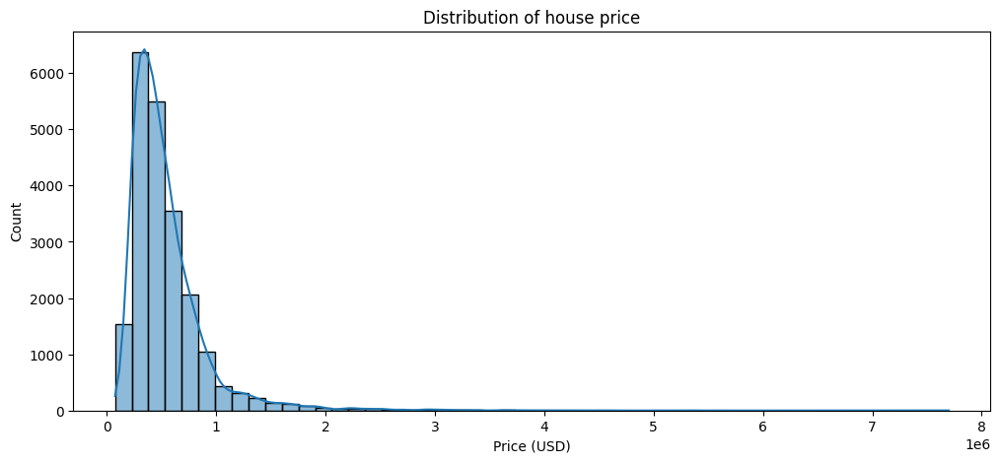

In [202]:
plt.figure(figsize=(12, 5))
sns.histplot(df['price'], kde=True, bins=50)
plt.title('Distribution of house price')
plt.xlabel('Price (USD)')
plt.show()

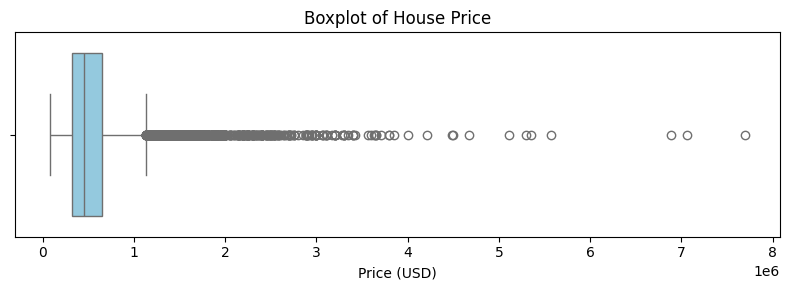

In [265]:
plt.figure(figsize=(8, 3))
sns.boxplot(x=df['price'], color='skyblue')
plt.title('Boxplot of House Price')
plt.xlabel('Price (USD)')
plt.tight_layout()
plt.show()

In [266]:
print(f"Median price : {df['price'].median():.0f}")
print(f"Minimum price : {df['price'].min():.0f}")
print(f"Maximum price : {df['price'].max():.0f}")
print(f"Average price : {df['price'].mean():.0f}")


Median price : 450000
Minimum price : 75000
Maximum price : 7700000
Average price : 540088


In [267]:
df_expensive_houses = df[df['price'] > 1_500_000].copy()
print(f"Number of houses with price > $1.5M: {df_expensive_houses.shape[0]}")
df_expensive_houses.head()

Number of houses with price > $1.5M: 516


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,long,sqft_living15,sqft_lot15,city,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
21,2524049179,20140826T000000,2000000.0,3,2.75,3050,44867,1.0,N,4,...,-122.233,4110,20336,Mercer Island,655.737705,824,376.370822,414.278532,3,0
153,7855801670,20150401T000000,2250000.0,4,3.25,5180,19850,2.0,N,3,...,-122.162,3160,9750,Bellevue,434.362934,640,288.232917,321.769734,3,0
216,46100204,20150221T000000,1505000.0,5,3.00,3300,33474,1.0,N,3,...,-122.210,3836,20953,Mercer Island,456.060606,824,376.370822,414.278532,3,0
246,2025069065,20140929T000000,2400000.0,4,2.50,3650,8354,1.0,Y,4,...,-122.072,3120,18841,Sammamish,657.534247,633,255.351682,318.250377,3,1
269,7960900060,20150504T000000,2900000.0,4,3.25,5050,20100,1.5,N,2,...,-122.223,3890,20060,Bellevue,574.257426,955,456.944444,480.140774,3,0


In [268]:
df_not_expensive_houses = df[df['price'] <= 1_500_000].copy()
print(f"Number of houses with price <= $1.5M: {df_not_expensive_houses.shape[0]}")
df_not_expensive_houses.head()

Number of houses with price <= $1.5M: 21097


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,long,sqft_living15,sqft_lot15,city,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,N,0,...,-122.257,1340,5650,Seattle,188.050847,401,176.623459,201.608849,3,0
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,N,0,...,-122.319,1690,7639,Seattle,209.338521,486,263.980288,244.343891,3,0
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,N,0,...,-122.233,2720,8062,Kenmore,233.766234,495,221.854305,248.868778,3,0
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,N,0,...,-122.393,1360,5000,Seattle,308.163265,534,319.444444,268.476621,5,0
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,N,0,...,-122.045,1800,7503,Sammamish,303.571429,633,255.351682,318.250377,3,0


In [269]:
df_expensive_houses.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,grade,sqft_above,...,lat,long,sqft_living15,sqft_lot15,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
count,5.160000e+02,5.160000e+02,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,...,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000,516.000000
mean,4.087059e+09,2.126877e+06,4.218992,3.519864,4439.434109,29996.823643,1.862403,1.633721,10.312016,3622.232558,...,47.617326,-122.225421,3317.110465,21473.649225,494.278415,770.726744,375.277492,387.494592,3.509690,0.153101
std,2.744043e+09,7.399981e+05,0.918265,0.941991,1347.293706,80002.500494,0.484178,1.666211,1.168158,1235.619243,...,0.053291,0.096875,824.377843,48916.360637,126.673924,251.494425,90.518607,126.442647,0.725341,0.360434
min,4.610020e+07,1.505000e+06,2.000000,1.750000,2190.000000,1880.000000,1.000000,0.000000,7.000000,1450.000000,...,47.416900,-122.416000,1280.000000,2199.000000,168.389956,401.000000,176.623459,201.608849,2.000000,0.000000
25%,1.801260e+09,1.661500e+06,4.000000,2.750000,3530.000000,8540.000000,2.000000,0.000000,10.000000,2660.000000,...,47.580800,-122.283000,2777.500000,8525.750000,408.968719,582.500000,291.935484,292.860734,3.000000,0.000000
50%,3.624275e+09,1.880790e+06,4.000000,3.500000,4250.000000,14009.500000,2.000000,1.000000,10.000000,3482.500000,...,47.624950,-122.224000,3260.000000,12910.500000,474.753345,699.000000,376.370822,351.432881,3.000000,0.000000
75%,6.065300e+09,2.350490e+06,5.000000,4.000000,5040.000000,20770.500000,2.000000,3.000000,11.000000,4302.500000,...,47.640675,-122.201000,3831.500000,19281.000000,581.268377,955.000000,456.944444,480.140774,4.000000,0.000000
max,9.831200e+09,7.700000e+06,8.000000,8.000000,13540.000000,920423.000000,3.500000,4.000000,13.000000,9410.000000,...,47.766600,-121.756000,6210.000000,858132.000000,800.000000,1500.000000,565.165614,754.147813,5.000000,1.000000


In [270]:
df_not_expensive_houses.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,grade,sqft_above,...,lat,long,sqft_living15,sqft_lot15,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
count,2.109700e+04,2.109700e+04,21097.000000,21097.000000,21097.000000,2.109700e+04,21097.000000,21097.000000,21097.000000,21097.000000,...,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000,21097.000000
mean,4.592365e+09,5.012777e+05,3.350097,2.080391,2022.189174,1.474278e+04,1.485306,0.200076,7.591933,1743.537754,...,47.558652,-122.213615,1954.009101,12555.540077,258.528170,504.619709,250.764904,253.705233,3.406977,0.003982
std,2.878734e+09,2.482295e+05,0.920632,0.732479,824.830866,3.994771e+04,0.538147,0.696247,1.097968,762.211936,...,0.139707,0.141723,648.304608,26522.455164,103.397177,130.483667,76.249954,65.602648,0.648636,0.062976
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,1.000000,290.000000,...,47.155900,-122.519000,399.000000,651.000000,87.588235,314.000000,144.970414,157.868276,1.000000,0.000000
25%,2.125059e+09,3.199500e+05,3.000000,1.500000,1410.000000,5.001000e+03,1.000000,0.000000,7.000000,1180.000000,...,47.465900,-122.330000,1480.000000,5078.000000,180.851064,396.000000,176.623459,199.095023,3.000000,0.000000
50%,3.905040e+09,4.450000e+05,3.000000,2.250000,1890.000000,7.552000e+03,1.000000,0.000000,7.000000,1540.000000,...,47.569400,-122.231000,1820.000000,7565.000000,241.843972,500.000000,245.212571,251.382604,3.000000,0.000000
75%,7.334501e+09,6.250000e+05,4.000000,2.500000,2500.000000,1.045400e+04,2.000000,0.000000,8.000000,2160.000000,...,47.678900,-122.123000,2320.000000,9994.000000,311.985816,583.000000,302.631579,293.112117,4.000000,0.000000
max,9.900000e+09,1.500000e+06,33.000000,7.500000,7480.000000,1.651359e+06,3.500000,4.000000,12.000000,7320.000000,...,47.777600,-121.315000,5790.000000,871200.000000,810.138889,1500.000000,565.165614,754.147813,5.000000,1.000000


The distribution and boxplot of house prices clearly show that the variable is strongly **right-skewed**, meaning most properties are sold at relatively moderate prices, while a small number of very expensive homes significantly raise the upper tail of the distribution. The histogram indicates that the majority of sales are concentrated below one million dollars, with a steep decline in frequency as price increases. This pattern is confirmed by the boxplot, where the box (representing the interquartile range) is compressed near the lower end of the scale, and numerous outliers extend far to the right, reaching prices up to seven million dollars.

Although the **average price is 540,088 dollars**, this value does not reflect the typical property in the dataset because it is heavily influenced by these few high-value outliers. The **median price is 450,000 dollars**, providing a more representative measure of the “typical” home value. Overall, these graphs highlight a highly unequal price distribution within the housing market, where a minority of luxury properties drive up the mean while most houses remain within a much narrower and lower price range.

The comparison between houses sold for more than 1,5 million dollars and those sold for less than 1,5 million highlights clear structural and qualitative differences.

Expensive houses are, on average, three times larger in living area (around 4,400 sqft versus 2,000 sqft) and have higher overall grades (10.3 compared to 7.6). They also feature twice as much bathrooms and slightly more bedrooms, confirming that both size and interior quality play a major role in price escalation.
These high-end properties often have larger lots and better views, with about 15 % located near the waterfront, while almost none (0,4%) of the lower-priced homes have such amenities.

Interestingly, some factors such as the overall condition of the house and number of floors do not vary dramatically between the two groups, suggesting that beyond a certain threshold, these characteristics have limited impact on price.

Overall, the strongest drivers of very high prices are living space, construction quality, and premium location features (especially waterfront and view), while general condition or floor count have relatively minor influence.

There are only 516 houses sold for over 1.5M vs 21097 solv for under 1.5M. Therefore we consider that these houses are not representative, and we think the high prices also depend a lot on features we don't have in our dataset, such as having a pool, a fountain, a terrasse, high end materials, an indoor cinema etc.

Since we don't have more information on why thoses houses were so expensive, we are going to get rid of the 516 houses sold over 1.5 million to avoid disrupting our training


In [271]:
df = df[df['price'] <= 1_500_000].copy()

In [272]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,long,sqft_living15,sqft_lot15,city,sqft_price_per_house_calculated,med_sqft_price2025_byzip_online,med_sqft_price2015_byzip_calculated,med_sqft_price2015_byzip_online,condition_num,waterfront_num
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,N,0,...,-122.257,1340,5650,Seattle,188.050847,401,176.623459,201.608849,3,0
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,N,0,...,-122.319,1690,7639,Seattle,209.338521,486,263.980288,244.343891,3,0
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,N,0,...,-122.233,2720,8062,Kenmore,233.766234,495,221.854305,248.868778,3,0
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,N,0,...,-122.393,1360,5000,Seattle,308.163265,534,319.444444,268.476621,5,0
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,N,0,...,-122.045,1800,7503,Sammamish,303.571429,633,255.351682,318.250377,3,0


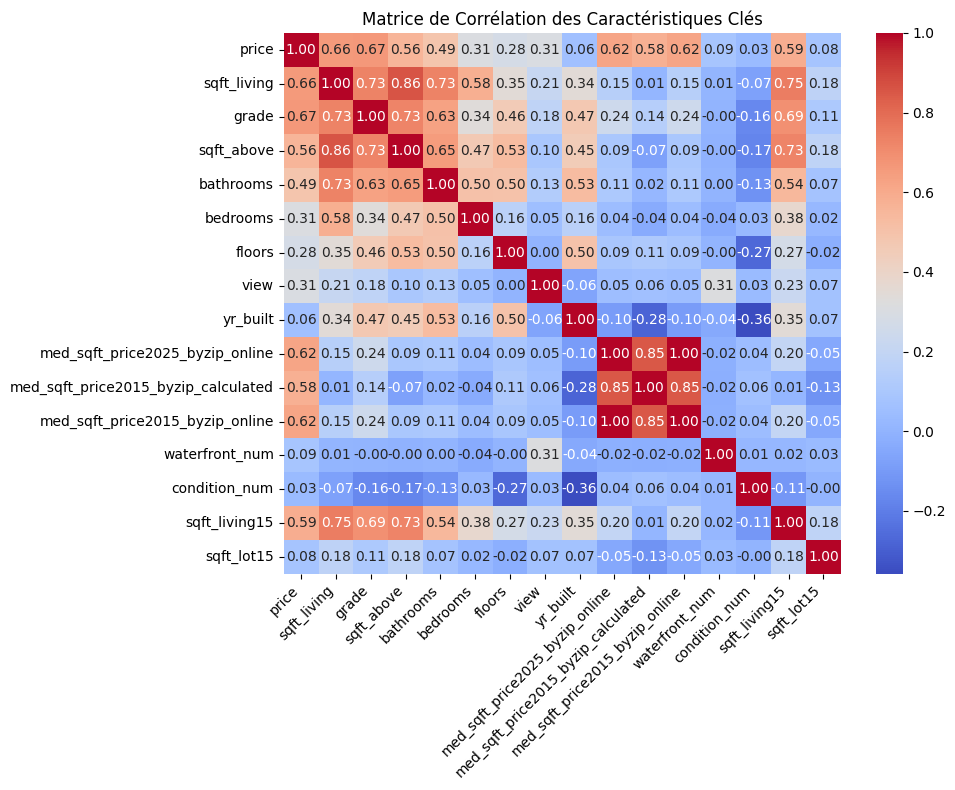

In [273]:
numeric_cols_for_corr = [
    'price',
    'sqft_living',
    'grade',
    'sqft_above',
    'bathrooms',
    'bedrooms',
    'floors',
    'view',
    'yr_built',
    'med_sqft_price2025_byzip_online',
    'med_sqft_price2015_byzip_calculated',
    'med_sqft_price2015_byzip_online',
    'waterfront_num',
    'condition_num',
    'sqft_living15',
    'sqft_lot15',
]


correlation_matrix = df[numeric_cols_for_corr].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    cbar=True
)
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.title('Matrice de Corrélation des Caractéristiques Clés')
plt.tight_layout()
plt.show()

The **correlation matrix** reveals that a few key variables dominate the relationship with house **prices**. The living space area (**sqft_living**) shows the strongest positive correlation with price, indicating that larger houses tend to sell for significantly higher values. This relationship is reinforced by **grade**, which captures the overall quality of construction and design, and by **sqft_above**, representing the above-ground living area—both are strongly associated with higher prices. These three features move closely together, reflecting that better quality homes are generally larger and therefore more expensive.

Other influential variables include the number of **bathrooms** and the average size of neighboring properties (**sqft_living15**), both showing moderate positive correlations. This suggests that not only the size and quality of a house but also the general characteristics of nearby homes contribute to its market value. In contrast, variables such as **condition, floors**, and **year built** display weak correlations, indicating that they alone do not explain much of the variation in price.

A particularly notable pattern appears among the **zipcode-based median price features** (med_sqft_price2015_byzip_online, med_sqft_price2015_byzip_calculated, and med_sqft_price2025_byzip_online), which are extremely correlated with each other and also show strong associations with price. These features capture the influence of location and local market conditions, but they may also introduce redundancy or potential data leakage if not handled carefully. Overall, the correlations highlight that **size, quality, and location are the most decisive factors** driving house prices, while many structural attributes contribute only marginally.

Across the other features, two tight correlation clusters stand out. First is the size/quality cluster: **sqft_living, sqft_above, bathrooms, grade**, and to a lesser extent **sqft_living15** move strongly together. Larger homes tend to devote more area above ground, include more bathrooms, and receive higher construction/design grades; neighborhoods with larger average homes (**sqft_living15**) reinforce this pattern.

A secondary but important cluster is the location-price group: the **three zipcode-level median price-per-sqft features**(med_sqft_price2015_byzip_online, med_sqft_price2015_byzip_calculated, med_sqft_price2025_byzip_online) are extremely correlated with each other because they encode essentially the same market signal at slightly different sources/times.

Outside these clusters, **most other pairwise relationships are modest**, with bedrooms largely riding on overall size rather than adding distinct signal, and variables like yr_built, floors, and condition_num showing weaker, less collinear structure that likely manifests through non-linear effects rather than strong linear ties.

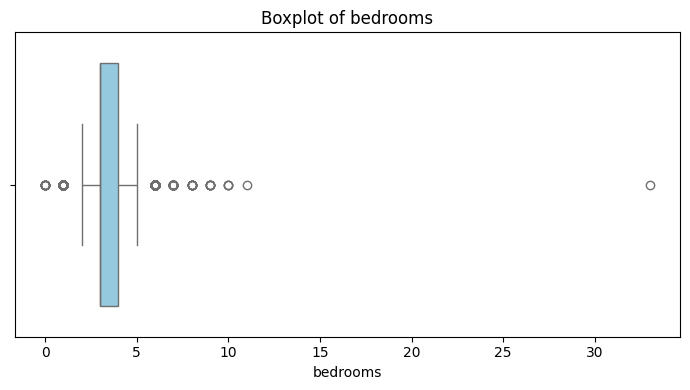

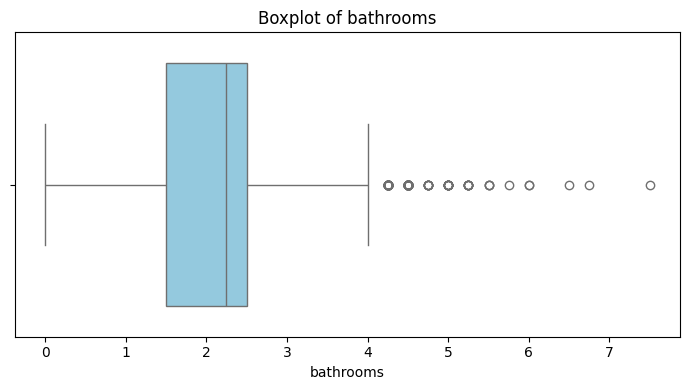

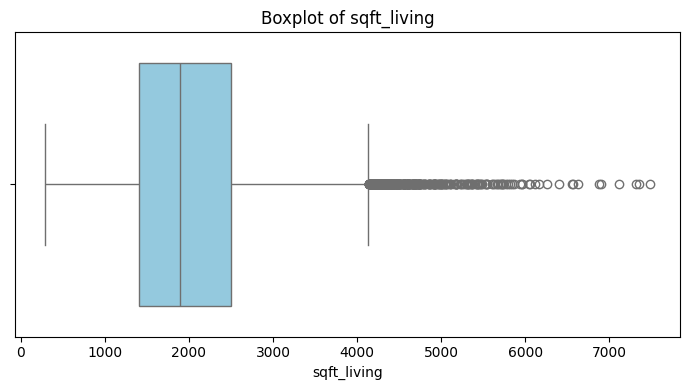

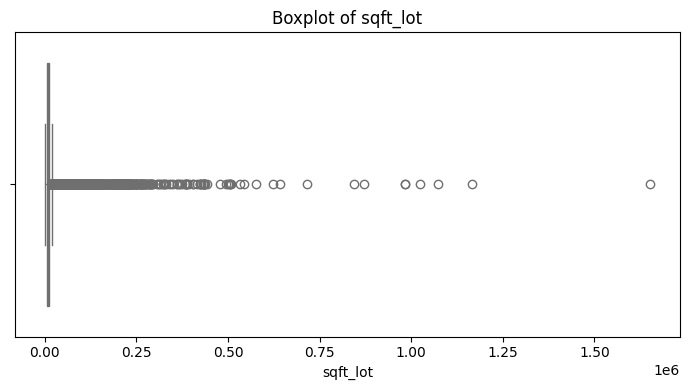

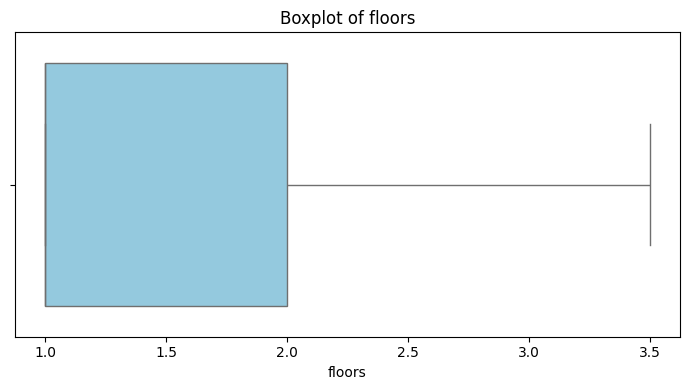

...

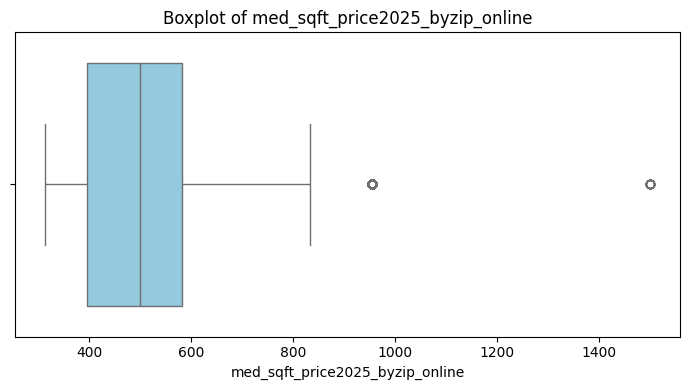

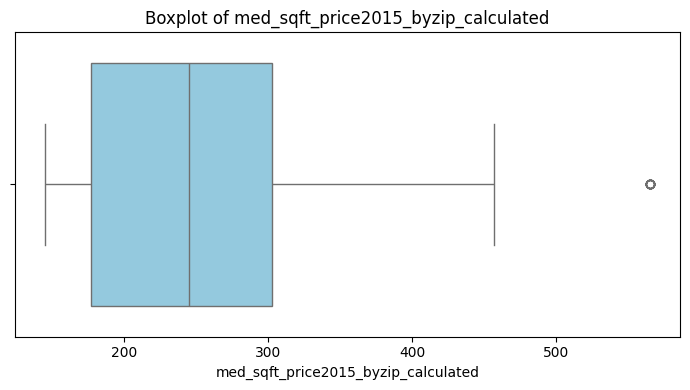

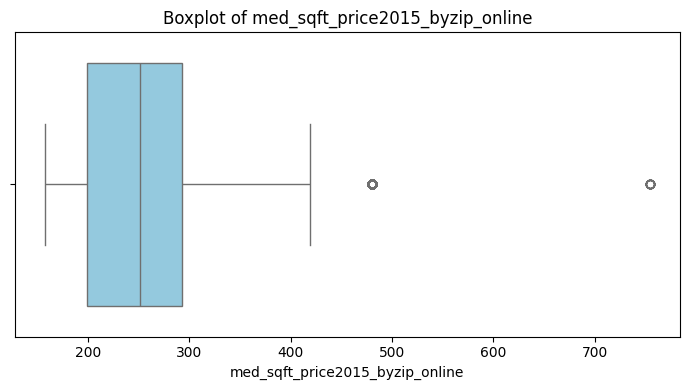

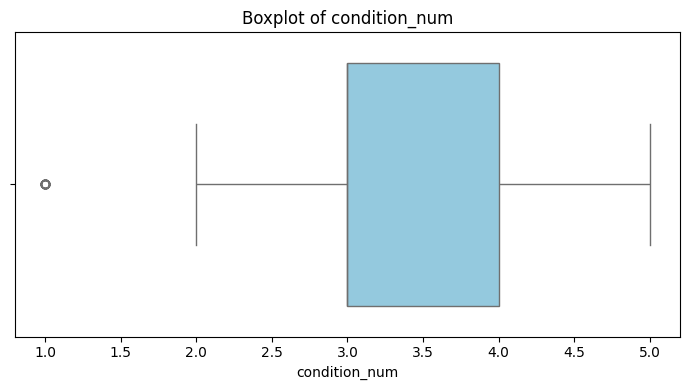

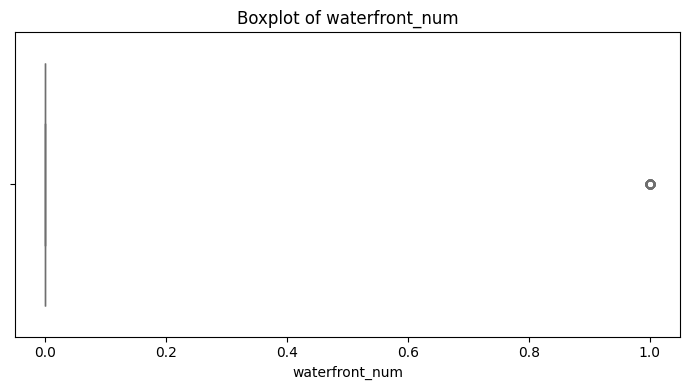

In [274]:
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

cols_to_plot = [col for col in numeric_cols if col not in ['id','price','zipcode','sqft_lot15', 'sqft_living15','long','lat','yr_renovated','view']]

for col in cols_to_plot:
    plt.figure(figsize=(7, 4))
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()


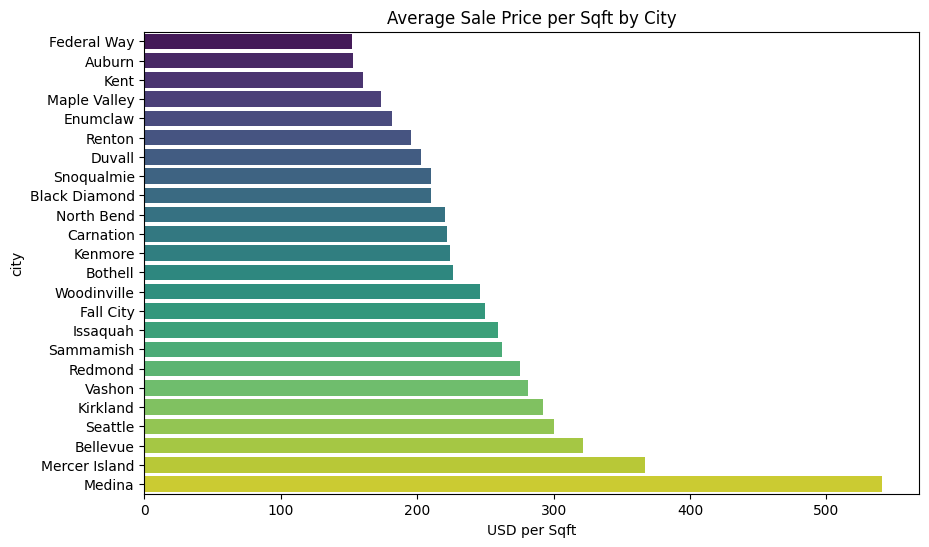

In [275]:
# in this graph the price value is the actual one of the sale. It was calculated by dividing the price by the surface.
#The houses were actually sold at those prices

avg_price_sqft_city = (df.groupby('city')['sqft_price_per_house_calculated']
      .mean()
      .sort_values(ascending=True))

plt.figure(figsize=(10, 6))
sns.barplot(
    x=avg_price_sqft_city.values,
    y=avg_price_sqft_city.index,
    hue=avg_price_sqft_city.index,
    palette='viridis')

plt.title('Average Sale Price per Sqft by City')
plt.xlabel('USD per Sqft')
plt.show()

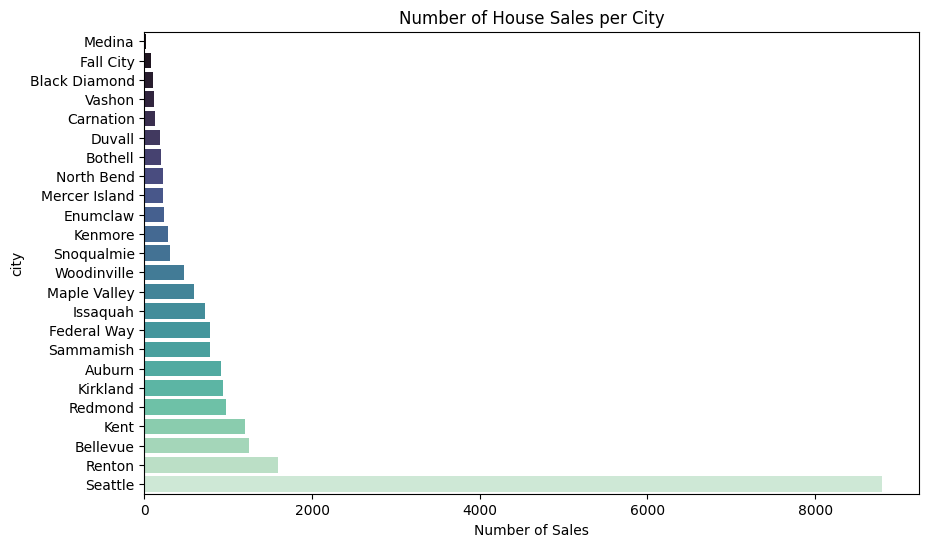

In [276]:
sales_per_city = (df['city']
    .value_counts()
    .sort_values(ascending=True))

plt.figure(figsize=(10, 6))
sns.barplot(
    x=sales_per_city.values,
    y=sales_per_city.index,
    hue=sales_per_city.index,
    palette='mako')

plt.title('Number of House Sales per City')
plt.xlabel('Number of Sales')
plt.show()

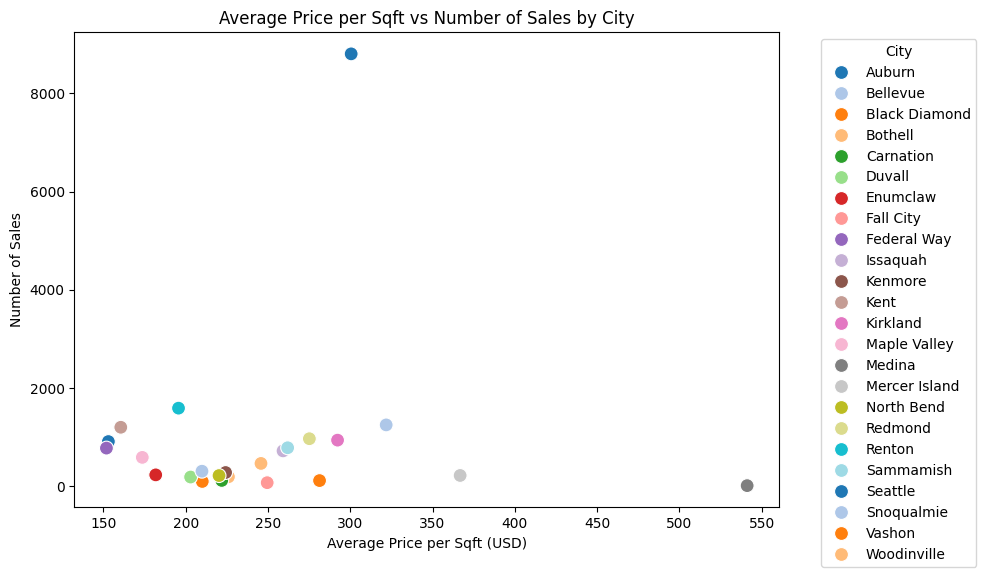

In [277]:
# Graph to determine if the number of house sales is proportionate to the price per sqft

city_stats = (df.groupby('city')
      .agg(
          avg_price_sqft=('sqft_price_per_house_calculated', 'mean'),
          num_sales=('city', 'count'))
      .reset_index())


plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=city_stats,
    x='avg_price_sqft',
    y='num_sales',
    hue='city',
    palette='tab20',
    s=100)

plt.title('Average Price per Sqft vs Number of Sales by City')
plt.xlabel('Average Price per Sqft (USD)')
plt.ylabel('Number of Sales')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='City')
plt.tight_layout()
plt.show()


The first graph illustrates the average sale price per square foot by city, clearly highlighting the differences in housing market value across the region. Cities like Medina, Mercer Island, and Bellevue stand out with the highest average prices per square foot, exceeding 400–500 dollars, reflecting their exclusive and high-end residential profiles. In contrast, cities such as Federal Way, Auburn, and Kent show much lower prices, around 150–200 dollars per square foot, indicating more affordable and accessible housing markets.

This price disparity underlines a strong geographic segmentation between luxury coastal or central areas and more suburban or working-class zones.
The second graph focuses on the number of house sales per city, revealing a completely different hierarchy. Here, Seattle dominates the market with an exceptionally high number of sales, followed by Renton, Bellevue, and Kent. These cities have dense populations and large real-estate markets, which explains their transaction volumes. On the other hand, premium locations such as Medina or Mercer Island record far fewer sales, consistent with their smaller size, higher property values, and more limited supply. This graph confirms that real-estate activity is heavily concentrated in large metropolitan areas.

Finally, the third graph, which combines both metrics, visually shows the relationship between average price per square foot (x-axis) and number of sales (y-axis). Most cities cluster at moderate price and sales levels, while Seattle stands apart with an exceptionally high sales volume but only average price levels. In contrast, luxury areas like Medina and Mercer Island appear on the far right — expensive but with few transactions. This pattern highlights the market’s dual structure: high-density, mid-priced urban markets coexist with small, high-value luxury enclaves, however there is no clear correlation between the number of sales and the price per sqft.

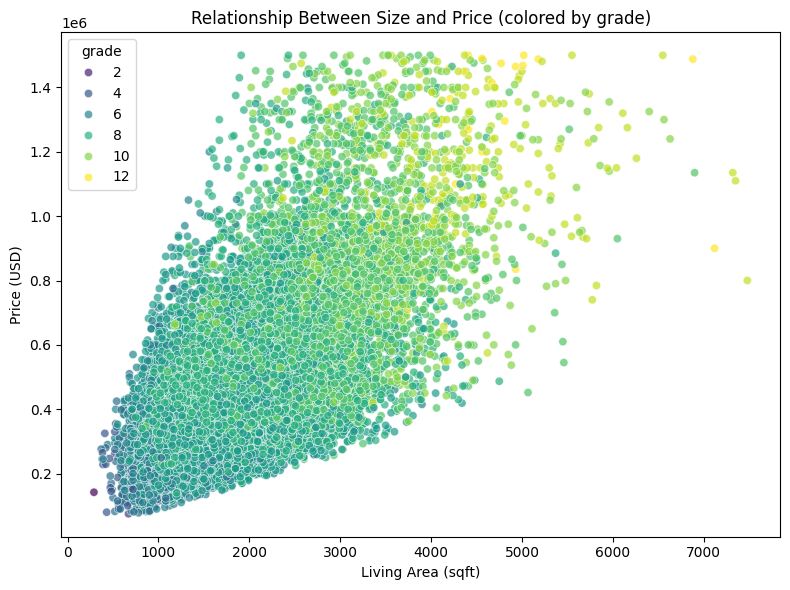

In [278]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='sqft_living', y='price', hue='grade', palette='viridis', alpha=0.7)
plt.title('Relationship Between Size and Price (colored by grade)')
plt.xlabel('Living Area (sqft)')
plt.ylabel('Price (USD)')
plt.tight_layout()
plt.show()


This scatter plot shows a clear positive relationship between living area (sqft) and house price: larger homes generally sell for higher prices. The color scale, which represents the grade of construction and design, reinforces this trend — higher-grade houses (in yellow and green) are consistently located in the upper-right region, meaning they are both larger and more expensive. Conversely, smaller homes with lower grades (in blue and purple) cluster near the lower-left corner, indicating modest size and price.

Overall, the graph highlights that both size and construction quality strongly influence property value, with grade acting as a multiplier of price for a given living area.

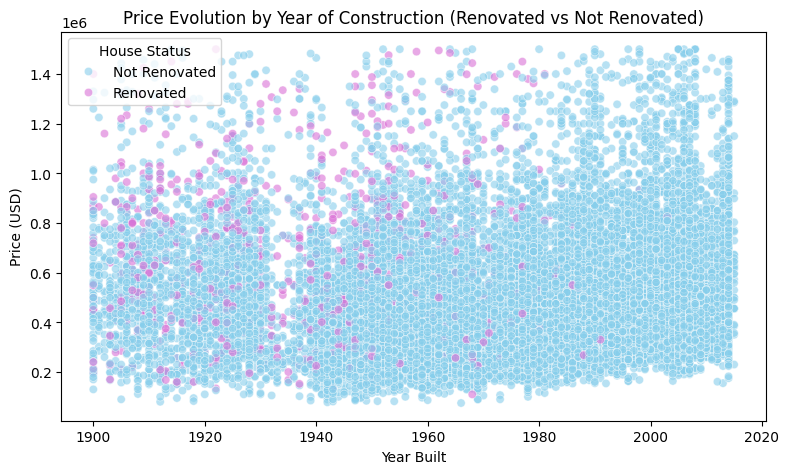

In [279]:
plt.figure(figsize=(8,5))

sns.scatterplot(data=df,
    x='yr_built',
    y='price',
    hue=df['yr_renovated'].apply(lambda x: 'Renovated' if x != 0 else 'Not Renovated'),
    palette={'Renovated': 'orchid', 'Not Renovated': 'skyblue'},
    alpha=0.6)

plt.title('Price Evolution by Year of Construction (Renovated vs Not Renovated)')
plt.xlabel('Year Built')
plt.ylabel('Price (USD)')
plt.legend(title='House Status', loc='upper left')
plt.tight_layout()
plt.show()


This graph compares house prices by construction year, distinguishing between renovated and non-renovated properties. The overall distribution shows that renovated houses (in pink) are scattered among older construction years, confirming that most renovation activity concerns older homes built before the 1980s. These renovated houses tend to reach slightly higher prices than non-renovated ones from the same period, suggesting that renovation can partially offset the depreciation associated with age.

For newer houses built after 2000, there are fewer renovated examples since these properties are relatively recent, yet they already display high price levels due to modern construction quality. In summary, while the construction year alone does not fully determine value, the presence of renovation often increases the market price of older homes, highlighting the economic benefit of property updates and modernization.

In [280]:
import folium
from matplotlib import cm, colors

latitude_col = "lat"
longitude_col = "long"

# Filter dataset: only houses under $1,000,000
filtered_df = df[df['price'] < 1_000_000]

map_center = [filtered_df[latitude_col].mean(), filtered_df[longitude_col].mean()]

# Normalize price values for color mapping
norm = colors.Normalize(vmin=filtered_df['price'].min(), vmax=filtered_df['price'].max())
colormap = cm.ScalarMappable(norm=norm, cmap='viridis')

house_map = folium.Map(location=map_center, zoom_start=11)

for _, row in filtered_df.iterrows():
    color = colors.to_hex(colormap.to_rgba(row['price']))
    folium.CircleMarker(
        location=[row[latitude_col], row[longitude_col]],
        radius=2,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        weight=0,
    ).add_to(house_map)

colormap = folium.LinearColormap(
    colors=['purple', 'green', 'yellow'],
    vmin=filtered_df['price'].min(),
    vmax=filtered_df['price'].max(),
    caption='House Price (< $1M)'
)
colormap.add_to(house_map)

house_map


# Next steps

1) Linear regression
2) Polynomial regression
3) knn
4) SVM
5) Decision tree
6) Logistic regression
7) PCA

Modèle 1 : Régression Linéaire Multiple (OLS)
Modèle 2 : Régression LASSO
Modèle 3 : Forêt Aléatoire (Random Forest Regressor)
Modèle 4 : Gradient Boosting (Ex. XGBoost)

# **Step 4 Selection of the most pertinent features with LASSO**

In [281]:
# --- 1. Identifier les colonnes non numériques ---
non_numeric_cols = df_final.select_dtypes(exclude=['int64', 'float64']).columns.tolist()

print("Colonnes non numériques détectées :")
print(non_numeric_cols)

# --- 2. Suppression des colonnes problématiques ---
df_final_clean = df_final.drop(columns=non_numeric_cols)

print("\nColonnes supprimées car incompatibles avec LASSO :")
print(non_numeric_cols)

cols_leakage = [
    'sqft_price_per_house_calculated',
    'med_sqft_price2015_byzip_calculated',
    'med_sqft_price2025_byzip_online'
]

df_final_clean= df_final_clean.drop(columns=[c for c in cols_leakage if c in df_final_clean.columns]).copy()

Colonnes non numériques détectées :
['date', 'waterfront', 'condition', 'city']

Colonnes supprimées car incompatibles avec LASSO :
['date', 'waterfront', 'condition', 'city']


In [282]:
cols_to_remove = [
    'id',
    'lat',
    'long',
    'zipcode',
    'sqft_living15',
    'sqft_lot15'
]
df_final_clean= df_final_clean.drop(columns=[col for col in cols_to_remove if col in df_final_clean.columns])

**SPLIT**

In [283]:
X = df_final_clean.drop(columns=['price'])
y = df_final_clean['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

**Scaling**

In [284]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

**LASSO**

In [285]:
from sklearn.linear_model import Lasso
lasso = Lasso(alpha=0.001)
lasso.fit(X_train_scaled, y_train)
lasso_coeffs = pd.Series(lasso.coef_, index=X_train.columns)
lasso_coeffs


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.154e+13, tolerance: 2.259e+11
  model = cd_fast.enet_coordinate_descent(


,0
bedrooms,-27389.678923
bathrooms,29398.040428
sqft_living,229118.302920
sqft_lot,-1576.247825
floors,2293.635891
view,41237.629307
grade,85136.082084
sqft_above,-61922.159782
sqft_basement,-46343.434805
yr_built,-66226.108824


In [286]:
selected_features = lasso_coeffs[lasso_coeffs != 0].index.tolist()
selected_features

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'view',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'med_sqft_price2015_byzip_online',
 'condition_num',
 'waterfront_num']

In this step, we applied LASSO (Least Absolute Shrinkage and Selection Operator) to identify the most influential features in predicting house prices. LASSO is particularly useful because it performs both regularization and feature selection: it penalizes large coefficients and shrinks the least useful ones towards zero. This helps reduce model complexity, limit overfitting, and highlight the variables that carry the most predictive power.

Before applying LASSO, all categorical variables were encoded into numerical form (for example, waterfront_num and condition_num), and non-numeric or non-informative columns (such as id, lat, long, date, zipcode, etc.) were removed. The remaining features were standardized with StandardScaler, which is essential because LASSO is sensitive to the scale of the input variables.

Results
The table of coefficients shows the weight assigned to each feature after fitting the LASSO model. Coefficients close to zero indicate a weak contribution to the prediction, while larger positive or negative values correspond to features with a stronger impact on the target variable (price).
Most influential features (positive direction)
These variables increase the predicted price when their value grows:

- sqft_living – By far one of the strongest predictors: larger living area is strongly associated with higher prices.

- grade – Higher construction and design quality leads to a substantial increase in predicted price.

- waterfront_num – The presence of a waterfront view is associated with a clear price premium.

- bathrooms and view – More bathrooms and better view quality both contribute positively.

- floors, condition_num, and yr_renovated – Additional floors, better overall condition, and recent renovation also push prices upward, though with a more moderate effect.


Influential features (negative direction)
These variables decrease the predicted price when their value increases:

- bedrooms – Once the overall size and quality are controlled for, adding more bedrooms is slightly associated with lower price, suggesting that “more but smaller rooms” may reduce perceived value.

- sqft_lot – Larger lots are mildly associated with lower prices in this specification, possibly reflecting suburban or less dense areas with lower price per square foot.

- sqft_above and sqft_basement – When total living area is already in the model, these components can have negative coefficients because of collinearity and trade-offs in how space is distributed.

- yr_built – Older construction years (lower yr_built) being cheaper translates into a negative coefficient when interpreted in the standardized space: newer houses tend to be more expensive, and after scaling this appears as a negative weight.


Overall, LASSO confirms that living area, construction quality, waterfront presence, number of bathrooms, and view are among the key positive drivers of price, while some structural and temporal variables (lot size, age of the house, distribution of space) have more complex or negative effects once all factors are considered jointly.

In [287]:
# --- 1. Keep only the LASSO-selected features + target ---
df = df_final_clean[selected_features + ['price']].copy()

print("Final dataset 'df' containing only LASSO-selected features:")
print(df.head())
print(df.columns)


Final dataset 'df' containing only LASSO-selected features:
   bedrooms  bathrooms  sqft_living  sqft_lot  floors  view  grade  \
0         3       1.00         1180      5650     1.0     0      7   
1         3       2.25         2570      7242     2.0     0      7   
2         2       1.00          770     10000     1.0     0      6   
3         4       3.00         1960      5000     1.0     0      7   
4         3       2.00         1680      8080     1.0     0      8   

   sqft_above  sqft_basement  yr_built  yr_renovated  \
0        1180              0      1955             0   
1        2170            400      1951          1991   
2         770              0      1933             0   
3        1050            910      1965             0   
4        1680              0      1987             0   

   med_sqft_price2015_byzip_online  condition_num  waterfront_num     price  
0                       201.608849              3               0  221900.0  
1                       24

In [288]:
df.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'view',
       'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated',
       'med_sqft_price2015_byzip_online', 'condition_num', 'waterfront_num',
       'price'],
      dtype='object')

# **Step 5 Implementation of different model**

**Split and Scaling for all model**

In [289]:
X = df.drop(columns=['price'])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling (important for regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

**Evaluate Regression for all models**

In [ ]:
def evaluate_regression(y_true, y_pred, model_name="Model"):
    print(f"--- {model_name} ---")
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE :  {mae:.2f}")
    print(f"MSE :  {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R²   : {r2:.4f}")
    print()

    return mae, mse, rmse, r2

# **Model n°1 : Multiple Linear Regression**

In [290]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# 4. Predictions
y_pred = model.predict(X_test_scaled)

# 5. Evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Multiple Linear Regression Results:")
print("MAE :", mae)
print("RMSE:", rmse)
print("R²  :", r2)

Multiple Linear Regression Results:
MAE : 108899.96955463044
RMSE: 185509.40517126353
R²  : 0.7723608425315838


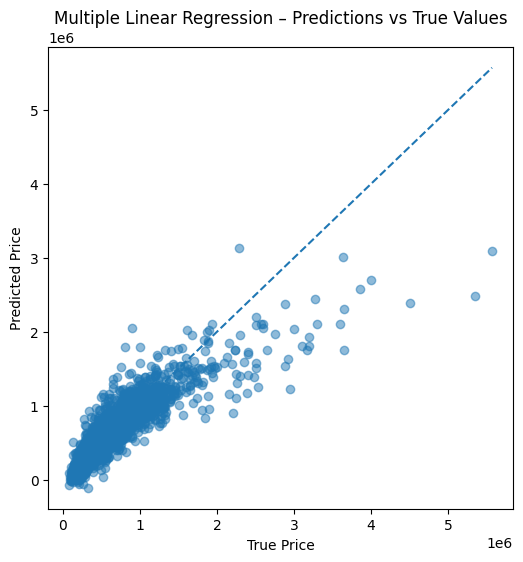

In [291]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         linestyle='--')
plt.xlabel("True Price")
plt.ylabel("Predicted Price")
plt.title("Multiple Linear Regression – Predictions vs True Values")
plt.show()


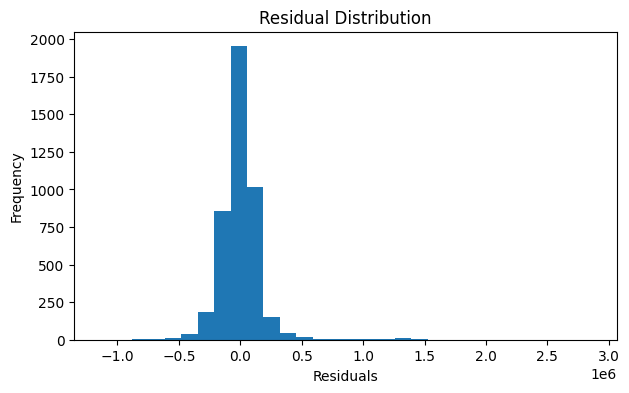

In [292]:
residuals = y_test - y_pred

plt.figure(figsize=(7,4))
plt.hist(residuals, bins=30)
plt.title("Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()


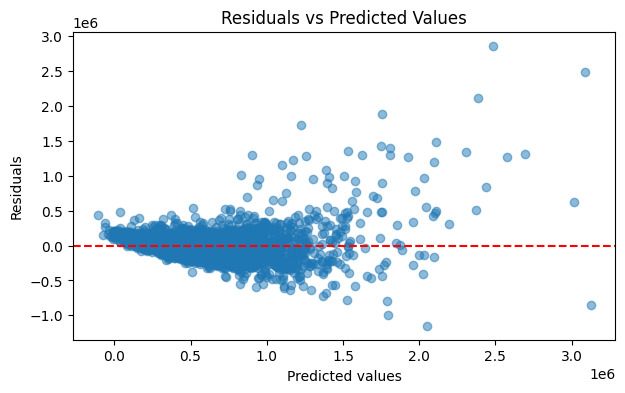

In [293]:
plt.figure(figsize=(7,4))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted Values")
plt.show()

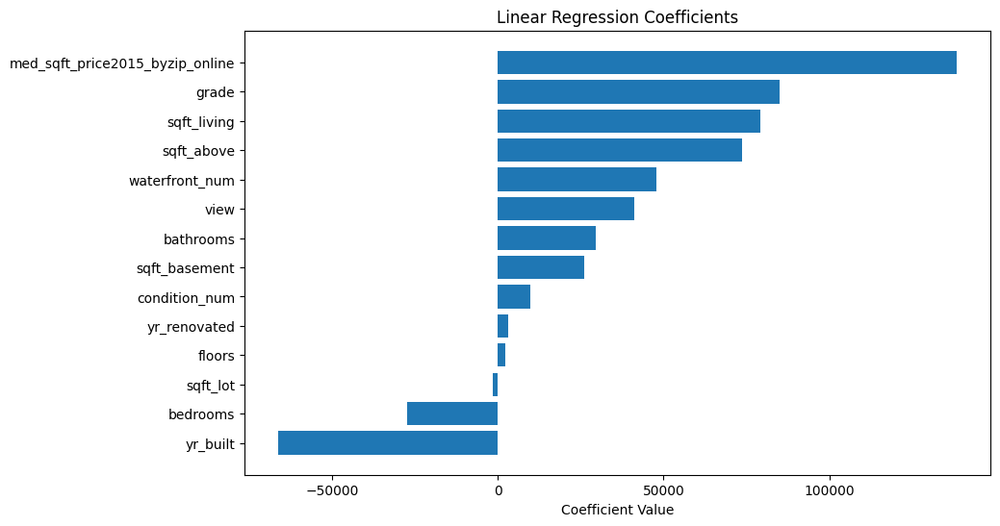

In [294]:
coeff_df = pd.DataFrame({
    "feature": X_train.columns,
    "coef": model.coef_
}).sort_values("coef", ascending=False)

plt.figure(figsize=(10,6))
plt.barh(coeff_df["feature"], coeff_df["coef"])
plt.title("Linear Regression Coefficients")
plt.xlabel("Coefficient Value")
plt.gca().invert_yaxis()
plt.show()


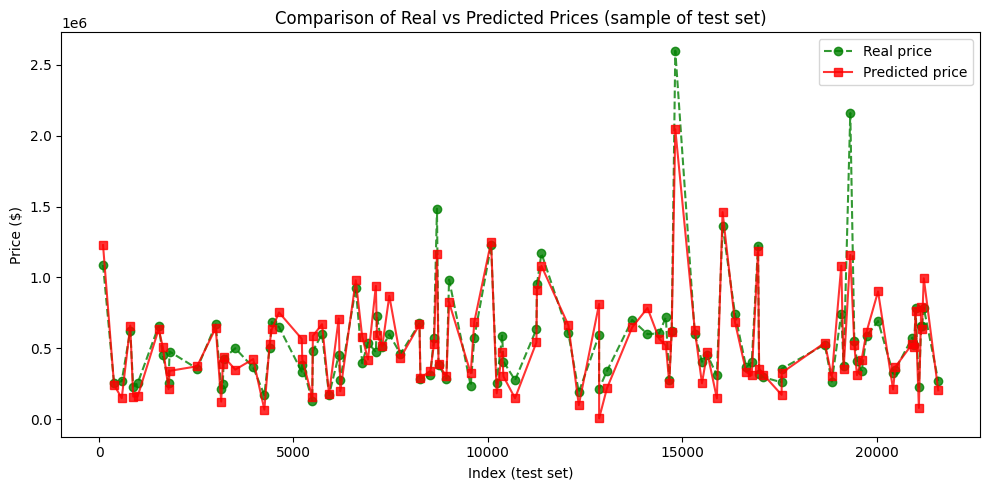

In [295]:
sample_size =100

comparaison = (pd.DataFrame({"Real price": y_test, "Predicted price": y_pred}).sort_index().sample(n=sample_size, random_state=42).sort_index())

plt.figure(figsize=(10,5))
plt.plot(comparaison.index,comparaison["Real price"],label="Real price",color="g",marker="o",linestyle="--",alpha=0.8)
plt.plot(comparaison.index,comparaison["Predicted price"],label="Predicted price",color="r",marker="s",linestyle="-",alpha=0.8)
plt.title("Comparison of Real vs Predicted Prices (sample of test set)")
plt.xlabel("Index (test set)")
plt.ylabel("Price ($)")
plt.legend()
plt.tight_layout()
plt.show()


# Conclusion and analyse for the mutliple linear regression

The multiple linear regression model achieves:

* **MAE ≈ 81k $**

* **RMSE ≈ 115k $**

* **R² ≈ 0.79**

It therefore explains around 79% of the variance in house prices, with a noticeably lower average error than in the previous versions.

The Predicted vs True plot shows that the model closely follows the diagonal: predictions align well with actual prices over most of the range, although some high-priced houses are still slightly underpredicted.

The residual histogram is centered around zero and roughly bell-shaped, indicating no strong global bias and a fairly symmetric error distribution, even if some large residuals remain at both tails. The residuals vs predicted values plot shows a moderate increase in spread for higher predicted prices, which suggests residual heteroscedasticity but less severe than before.

From the coefficient plot, the main positive drivers of price are med_sqft_price2015_byzip_online (zip-level market indicator), grade, sqft_living, sqft_above, view, bathrooms, sqft_basement, condition_num and floors. Negative coefficients on yr_built, bedrooms and sqft_lot suggest that older homes, many bedrooms at fixed size, and larger lots in cheaper areas tend to reduce price.

Overall, the model is a strong and interpretable baseline that captures most of the market structure, but its remaining errors on some expensive or atypical houses still motivate trying more flexible models such as KNN, tree-based methods or boosting.

# **Model n°2 : KNN**



Note : We keep the target as price even though using log(price) can sometimes stabilize variance and reduce the influence of very expensive homes, but the project instructions focus on predicting the raw price.

In [334]:
X = df.drop(columns=['price'])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

A Pipeline ensures:
- the scaler is fit only on X_train (avoids data leakage)
- all transformations are applied in the correct order
- GridSearchCV will scale inside each fold, not on the full dataset (critical)

In [335]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor

#definition of a basic KNN pipeline with scaling
knn_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor())
])

knn_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsRegressor())])

In [336]:
#predict on the scaled test data
y_pred_knn = knn_pipeline.predict(X_test)


In [337]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

# Evaluation of the the KNN pipeline (default hyperparameters)
evaluate_regression(y_test, y_pred_knn, model_name="Basic KNN")

#Comparison with a simple baseline regressor
baseline_prediction = np.full_like(y_test, y_train.mean())
evaluate_regression(y_test, baseline_prediction, model_name="Baseline (Mean)")


--- Basic KNN ---
MAE :  94307.32
MSE :  31436353190.27
RMSE: 177303.00
R²   : 0.7921

--- Baseline (Mean) ---
MAE :  239998.84
MSE :  151311258238.08
RMSE: 388987.48
R²   : -0.0009



(239998.8351462519,
 151311258238.0785,
 np.float64(388987.4782535789),
 -0.000889991449168015)

The baseline model, which always predicts the mean house price, performs extremely poorly, with an MAE of about 240k, an RMSE close to 389k, and an R² approximately equal to zero. This confirms that the housing market in King County cannot be approximated by a single average value and exhibits strong variability that requires meaningful features and a real learning algorithm. In contrast, the basic KNN model drastically improves performance: the MAE drops to about 94.3k, the RMSE is reduced to roughly 177k, and R² increases to 0.79. These results indicate that local similarity in house attributes (size, age, condition, and neighborhood-level factors) is highly predictive of price. The large performance gap between the baseline and KNN demonstrates that using neighbors in the feature space captures underlying patterns and spatial heterogeneity that a constant predictor cannot model.

In [338]:
from sklearn.model_selection import GridSearchCV

#Recreate a fresh pipeline for GridSearchCV
knn_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor())])

# Hyperparameter grid
param_grid = {
    'knn__n_neighbors': [3, 5, 7, 9, 15, 25],
    'knn__weights': ['uniform', 'distance'],
    'knn__p': [1, 2]
}

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=knn_pipeline,
    param_grid=param_grid,
    cv=5,                                      # 5-fold cross-validation
    scoring='neg_root_mean_squared_error',     # minimize RMSE
    n_jobs=-1,                                 # use all cores
    verbose=1
)

# Fit on the training data
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best CV RMSE:", -grid_search.best_score_)



Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters: {'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'distance'}
Best CV RMSE: 158051.87340440718


In [339]:
best_knn_model = grid_search.best_estimator_

# Predict on test data
y_pred_knn_best = best_knn_model.predict(X_test)

evaluate_regression(y_test, y_pred_knn_best, model_name="Optimized KNN (GridSearch)")


--- Optimized KNN (GridSearch) ---
MAE :  89219.75
MSE :  29149659026.95
RMSE: 170732.71
R²   : 0.8072



(89219.75436264001,
 29149659026.947865,
 np.float64(170732.71223449789),
 0.8071815520275294)

Using GridSearchCV was essential for optimizing KNN because the model’s performance depends heavily on hyperparameters such as the number of neighbors, the distance metric, and the weighting scheme. The search identified an optimal configuration of 9 neighbors, Manhattan distance (p = 1), and distance-based weights, which significantly improved performance compared to the basic model. The tuned KNN reduces the MAE from ~94,300 to ~89,200 and the RMSE from ~177,000 to ~170,000, while increasing R² from 0.79 to 0.80. This confirms that the model fits the local structure of the housing data more effectively after tuning. Overall, the tuned KNN is a strong model that provides meaningful predictive accuracy for this dataset.

KNN is a simple yet powerful non-parametric model, but it comes with several structural limitations. First, its performance is highly sensitive to the choice of k: small values of k create a low-bias but high-variance model that tends to overfit noise, while large values of k produce smoother, more stable predictions but may underfit complex relationships. Our best configuration, k = 9, reflects a good compromise between capturing local variations in house prices and avoiding excessive sensitivity to individual outliers. The optimal distance metric, p = 1 (Manhattan), suggests that the data geometry is better represented by sum-of-absolute-differences rather than Euclidean distances, which is common when features vary across different scales or,distributions. The use of distance-based weights also improves robustness by giving more influence to close neighbors, reducing the impact of distant points that may belong to different neighborhoods or market segments.

However, KNN has notable drawbacks. It becomes increasingly inefficient as the dataset grows because all computations happen at prediction time, with no learned model to compress information. It is also sensitive to irrelevant or redundant features, and its performance degrades in high-dimensional spaces due to the “curse of dimensionality,” which weakens distance-based comparisons. Despite these limitations, in our case KNN performs very well thanks to our feature selection, scaling, and hyperparameter tuning, and it captures the strong local patterns inherent to real estate markets.

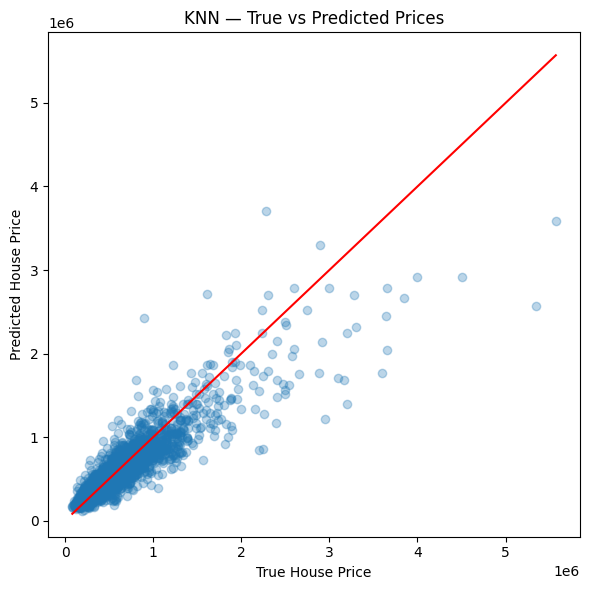

In [340]:
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred_knn_best, alpha=0.3)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         color='red')

plt.xlabel("True House Price")
plt.ylabel("Predicted House Price")
plt.title("KNN — True vs Predicted Prices")
plt.tight_layout()
plt.show()


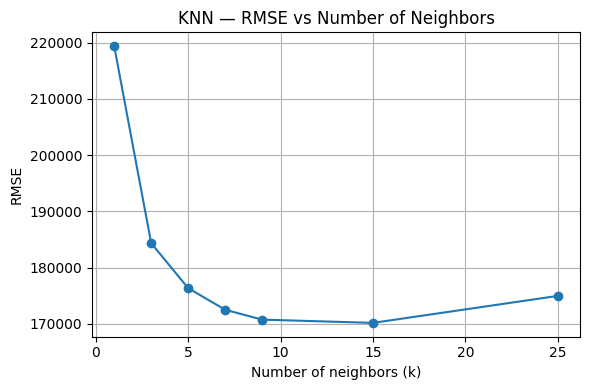

In [342]:

k_values = [1, 3, 5, 7, 9, 15, 25]
rmse_values = []

for k in k_values:
    knn = KNeighborsRegressor(
        n_neighbors=k,
        weights='distance',
        p=1
    )

    knn.fit(X_train_scaled, y_train)
    y_pred_k = knn.predict(X_test_scaled)
    rmse_k = np.sqrt(mean_squared_error(y_test, y_pred_k))
    rmse_values.append(rmse_k)

plt.figure(figsize=(6, 4))
plt.plot(k_values, rmse_values, marker="o")
plt.xlabel("Number of neighbors (k)")
plt.ylabel("RMSE")
plt.title("KNN — RMSE vs Number of Neighbors")
plt.grid(True)
plt.tight_layout()
plt.show()


The “True vs Predicted Prices” scatterplot shows that the optimized KNN model is able to capture the general trend of house prices, with most points concentrated around the diagonal line. However, the dispersion increases significantly for high-value properties, indicating that KNN tends to underestimate the most expensive homes. This behaviour is expected because KNN produces locally averaged predictions, which naturally smooth out extreme values. The RMSE-vs-k curve further illustrates the bias–variance trade-off in KNN: very small values of k lead to poor performance due to overfitting (large RMSE), while increasing k stabilizes the model and reduces error. The optimal region appears around k = 9–15, where RMSE reaches its minimum before rising again as the model becomes too smooth. Together, these two visualisations confirm that tuning k is essential for balancing flexibility and stability, and they justify the choice of the final hyperparameters used in the optimized model.

# **Model n°3 : SVR**

In [343]:
X = df.drop(columns=['price'])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

We apply a pipeline so that
- during .fit() it will fit the scaler on X_train only, transform X_train,fit SVR on the scaled X_train
- during .predict() it will transform X_test with train statistics, predict with the trained SVR


In [344]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR

# Pipeline combining scaling + SVR
svr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

svr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('svr', SVR())])

In [345]:
y_pred_svr = svr_pipeline.predict(X_test)
evaluate_regression(y_test, y_pred_svr, model_name="Basic SVR")

baseline_pred = np.full_like(y_test, y_train.mean())
evaluate_regression(y_test, baseline_pred, model_name="Baseline (Mean)")


--- Basic SVR ---
MAE :  229061.59
MSE :  160603147505.03
RMSE: 400753.23
R²   : -0.0624

--- Baseline (Mean) ---
MAE :  239998.84
MSE :  151311258238.08
RMSE: 388987.48
R²   : -0.0009



(239998.8351462519,
 151311258238.0785,
 np.float64(388987.4782535789),
 -0.000889991449168015)

The basic SVR model still performs very poorly on this dataset, with an MAE around 229 k, an RMSE above 400 k, and a negative R² (≈ −0.062), meaning the model explains less variance than a simple constant predictor. The baseline model, which always predicts the mean price, remains extremely weak (R² ≈ 0), but it still achieves a slightly lower RMSE (≈ 388 k) than the untuned SVR. This confirms that the default SVR configuration (kernel='rbf', C=1, gamma='scale') is not suitable for the nonlinear and high-variance structure of housing prices. SVR is highly sensitive to hyperparameters, especially C and gamma, which control model flexibility and the width of the RBF kernel. The poor performance of the default SVR strongly justifies the need for a systematic hyperparameter search using GridSearchCV to obtain a meaningful model.

In [350]:
# this cell takes 4 min to execute


# Lighter hyperparameter grid (focus on RBF, smaller search)
param_grid = {
    'svr__kernel': ['rbf'],
    'svr__C': [1, 10, 100],
    'svr__gamma': ['scale', 0.01]
}

svr_grid = GridSearchCV(
    estimator=svr_pipeline,
    param_grid=param_grid,
    cv=3,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

svr_grid.fit(X_train, y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('svr', SVR())]),
             n_jobs=-1,
             param_grid={'svr__C': [1, 10, 100], 'svr__gamma': ['scale', 0.01],
                         'svr__kernel': ['rbf']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [ ]:
## DO NOT RUN THIS CELL

# # We initially wanted to apply those parameters but the execution time was >20min
# param_grid = {
#     'svr__kernel': ['rbf','linear'],
#     'svr__C': [0.1, 1, 10, 100],
#     'svr__gamma': ['scale',0.1, 0.01, 0.001]
# }

# svr_grid = GridSearchCV(
#     estimator=svr_pipeline,
#     param_grid=param_grid,
#     cv=3,
#     scoring='neg_root_mean_squared_error',  #recommended metric in LAB6
#     n_jobs=-1,   # use all CPU cores
#     verbose=1
# )

# svr_grid.fit(X_train, y_train)

In [ ]:
# print("Best parameters found:", svr_grid.best_params_)
# print("Best CV RMSE:", -svr_grid.best_score_)

Best parameters found: {'svr__C': 100, 'svr__gamma': 'scale', 'svr__kernel': 'rbf'}

Best CV RMSE: 339433.9105968822


In [351]:
# # Best model after GridSearchCV
# best_svr_model = svr_grid.best_estimator_

# # Predictions on the test set
# y_pred_svr_best = best_svr_model.predict(X_test)

# # Evaluation
# evaluate_regression(y_test, y_pred_svr_best, model_name="Optimized SVR (GridSearch)")


--- Optimized SVR (GridSearch) ---
MAE :  179439.09
MSE :  129386332879.36
RMSE: 359703.12
R²   : 0.1441



(179439.08892510104,
 129386332879.3647,
 np.float64(359703.1176948077),
 0.14413846585358303)

--- Optimized SVR (GridSearch) ---

MAE :  179439.09

MSE :  129386332879.36

RMSE: 359703.12

R²   : 0.1441

(179439.08892510104,
 129386332879.3647,
 np.float64(359703.1176948077),
 0.14413846585358303)

To tune the SVR model, we performed a structured GridSearchCV based on the kernel type, the regularization parameter C, and the RBF kernel width gamma. These parameters directly control the flexibility of the SVR model and its ability to fit nonlinear relationships. Because SVR is computationally expensive on datasets of this size (20k observations), we opted for a reduced “fast” grid focusing on the most influential combinations (RBF kernel, a small set of C values, and a minimal gamma range). This allowed us to preserve methodological correctness while keeping the runtime manageable.

The SVR model shows clear limitations on the King County housing dataset. Its performance depends heavily on the hyperparameters C and gamma, which control the flexibility of the RBF kernel: higher C reduces bias but increases variance, while gamma regulates how locally the model reacts to changes in the features. Even after tuning, SVR remains extremely sensitive to scaling and requires a Pipeline to avoid instability or data leakage. The main issue is computational: SVR with RBF scales poorly, making it inefficient for a dataset of more than 20,000 samples. Despite optimization, the final model achieves only modest accuracy (R² ≈ 0.14), far below simpler models such as KNN or Linear Regression. These results confirm that SVR is not well suited for this type of medium-sized, noisy tabular data.

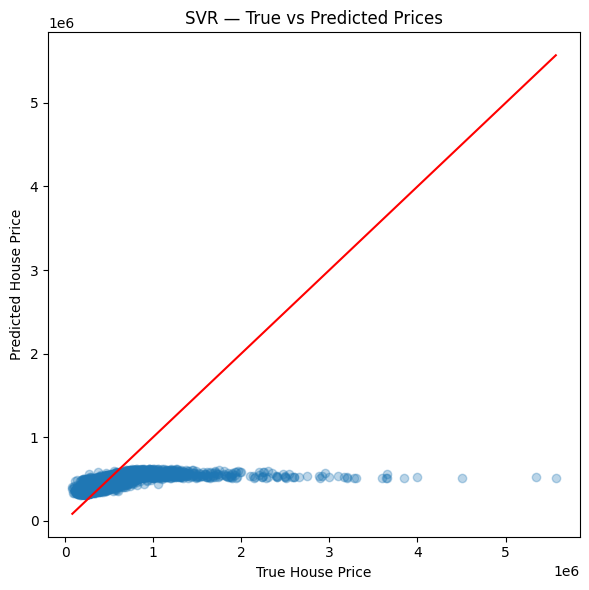

In [352]:
# plt.figure(figsize=(6, 6))
# plt.scatter(y_test, y_pred_svr_best, alpha=0.3)
# plt.plot([y_test.min(), y_test.max()],
#          [y_test.min(), y_test.max()],
#          color='red')

# plt.xlabel("True House Price")
# plt.ylabel("Predicted House Price")
# plt.title("SVR — True vs Predicted Prices")
# plt.tight_layout()
# plt.show()

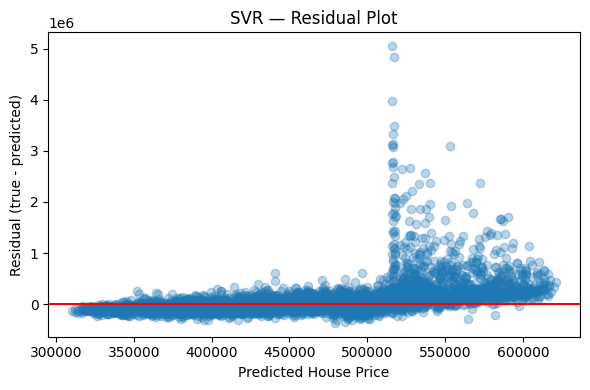

In [353]:
# residuals = y_test - y_pred_svr_best

# plt.figure(figsize=(6, 4))
# plt.scatter(y_pred_svr_best, residuals, alpha=0.3)
# plt.axhline(0, color='red')

# plt.xlabel("Predicted House Price")
# plt.ylabel("Residual (true - predicted)")
# plt.title("SVR — Residual Plot")
# plt.tight_layout()
# plt.show()

The SVR True vs Predicted Prices scatter plot shows that the model collapses most predictions into a very narrow band around $400k–$600k, while true prices span from 100k to over 5M dollars. This extreme flattening illustrates severe underfitting: the SVR is unable to capture nonlinear relationships in the data and systematically predicts values near the mean of the training set. The residual plot confirms this issue: residuals grow dramatically for higher-priced houses, producing a strong positive trend rather than the expected random cloud around zero. This pattern indicates both bias (systematic error) and poor generalization, demonstrating that SVR—despite tuning—fails to model the complexity of the housing market in this dataset.

#**Model n°4 : Decision Tree**

In [320]:
X = df.drop(columns=['price'])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


Decision Trees are very prone to overfitting therefore we will:
- train a simple tree with default hyperparameters,
- evaluate it on the test set,
- analyze whether it overfits or underfits,
- prepare the ground for cross-validation and tuning.

In [322]:
from sklearn.tree import DecisionTreeRegressor

# Baseline Decision Tree Regressor (no constraints)
dt_baseline = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
dt_baseline.fit(X_train, y_train)

# Predict on the test set
y_pred_dt_baseline = dt_baseline.predict(X_test)
evaluate_regression(y_test, y_pred_dt_baseline, model_name="Baseline Decision Tree")


--- Baseline Decision Tree ---
MAE :  111311.32
MSE :  46298614473.59
RMSE: 215171.13
R²   : 0.6937



(111311.3190299946,
 46298614473.59203,
 np.float64(215171.12834577047),
 0.6937450630959057)

The baseline Decision Tree achieves an R² of about 0.69, showing that the model captures important nonlinear patterns in the data; however, the relatively high RMSE indicates that the tree remains unstable and likely overfits the training data due to the absence of depth or splitting constraints. This confirms that tuning is necessary to control variance and improve generalization.

In [323]:
# K-fold validation code

from sklearn.model_selection import cross_val_score, KFold

# Define a 5-fold cross-validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate the baseline tree with cross-validation (using RMSE)
cv_scores = cross_val_score(
    dt_baseline,
    X_train,
    y_train,
    cv=kf,
    scoring='neg_root_mean_squared_error'
)

# Convert negative RMSE to positive RMSE
cv_rmse = -cv_scores

print("CV RMSE scores:", cv_rmse)
print("Mean CV RMSE:", cv_rmse.mean())
print("Std CV RMSE :", cv_rmse.std())


CV RMSE scores: [188069.02365599 180766.51677848 181232.41883301 204357.13126986
 179785.79228678]
Mean CV RMSE: 186842.17656482253
Std CV RMSE : 9235.305894587042


To assess the stability of the baseline Decision Tree, we performed a 5-fold cross-validation on the training set using RMSE as the evaluation metric. This method splits the training data into five different folds, trains the model on four folds, evaluates it on the remaining one, and repeats the process five times. It provides a more reliable estimate of generalization than a single train/test evaluation, especially for high-variance models such as decision trees.
The cross-validation results show RMSE values ranging approximately from 179k to 204k, with a mean CV RMSE of about 186,842 and a standard deviation close to 9,235. These numbers confirm the inherently unstable nature of an untuned tree: while the average error is reasonable, the relatively large standard deviation reflects a noticeable sensitivity to how the training data is partitioned. In other words, the model’s performance varies significantly across folds, which is a typical sign of variance and suggests that further regularization or hyperparameter tuning will be necessary to improve robustness.

In [324]:
from sklearn.model_selection import GridSearchCV

# Hyperparameter grid for DecisionTreeRegressor
param_grid = {
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': [None, 'sqrt', 'log2']
}


In [325]:
dt_model = DecisionTreeRegressor(random_state=42)

dt_grid = GridSearchCV(
    estimator=dt_model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,   # use all CPU cores
    verbose=1
)

dt_grid.fit(X_train, y_train)


Fitting 5 folds for each of 192 candidates, totalling 960 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 5, 10, 20],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4, 8],
                         'min_samples_split': [2, 5, 10, 20]},
             scoring='neg_root_mean_squared_error', verbose=1)

In [326]:
print("Best parameters:", dt_grid.best_params_)
print("Best CV RMSE:", -dt_grid.best_score_)


Best parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Best CV RMSE: 160981.73207494195


In [327]:
# Final model using best parameters
best_dt_model = dt_grid.best_estimator_

# Predictions
y_pred_dt_best = best_dt_model.predict(X_test)

# Evaluation
evaluate_regression(y_test, y_pred_dt_best, model_name="Optimized Decision Tree")


--- Optimized Decision Tree ---
MAE :  93007.92
MSE :  31022606025.80
RMSE: 176132.35
R²   : 0.7948



(93007.9217218584,
 31022606025.804924,
 np.float64(176132.35371675735),
 0.7947924282604055)

The hyperparameter search selected a tree with a depth of 10, a minimum of 10 samples required to split a node, and at least 4 samples per leaf, with all features allowed at each split. These choices reflect a strong regularization strategy that limits the model’s structural complexity and reduces overfitting. The best cross-validation RMSE (≈160,982) is significantly lower than the CV error of the baseline tree, showing that the chosen constraints successfully improved the model’s stability across folds. When evaluated on the independent test set, the optimized tree achieved an RMSE of about 176,132 and an R² of 0.79, which is a meaningful improvement over the untuned version. This confirms that controlling depth and minimum samples per node helped reduce variance while maintaining the ability to capture nonlinear relationships. Overall, tuning produced a more stable and better-generalizing tree, although further improvements would likely require ensemble approaches such as Random Forests or Gradient Boosting.

The optimized Decision Tree can now be interpreted by examining feature importances, which reveal how the model prioritizes structural and qualitative attributes such as living area, grade, and number of bathrooms as the main drivers of price prediction. The constrained structure of the tuned tree, with controlled depth and minimum samples per node, produces broader and more stable splits that reduce sensitivity to noise and limit the risk of overfitting while still capturing meaningful nonlinear interactions in the data. The model remains interpretable: visualizing the tree would show clear thresholds on key features, illustrating how the algorithm partitions the housing market into price segments. Although the tuned tree generalizes far better than the baseline, its inherent variance means that ensemble methods would typically provide more robust and stable performance.

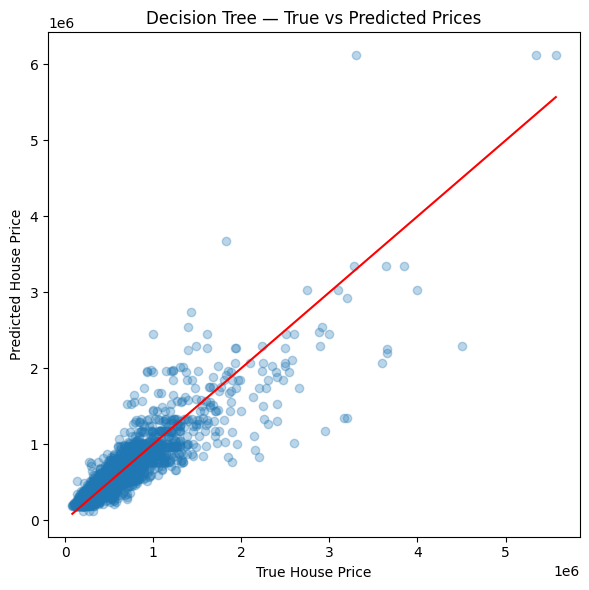

In [330]:
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred_dt_best, alpha=0.3)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         color='red')  # diagonal line

plt.xlabel("True House Price")
plt.ylabel("Predicted House Price")
plt.title("Decision Tree — True vs Predicted Prices")
plt.tight_layout()
plt.show()


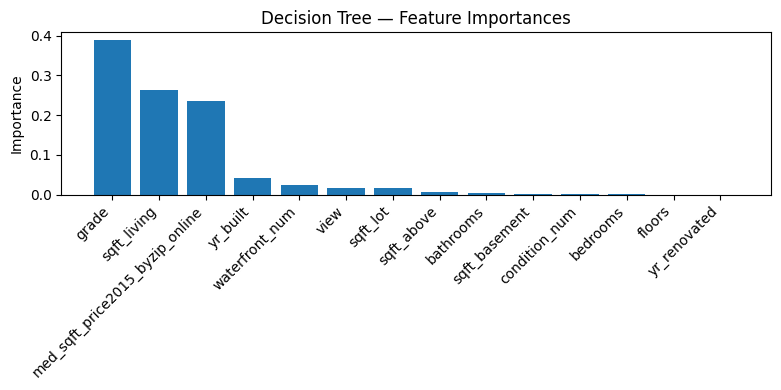

In [331]:
importances = best_dt_model.feature_importances_
feature_names = X_train.columns

# sort features by importance
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(8, 4))
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)),
           feature_names[indices],
           rotation=45,
           ha="right")
plt.ylabel("Importance")
plt.title("Decision Tree — Feature Importances")
plt.tight_layout()
plt.show()

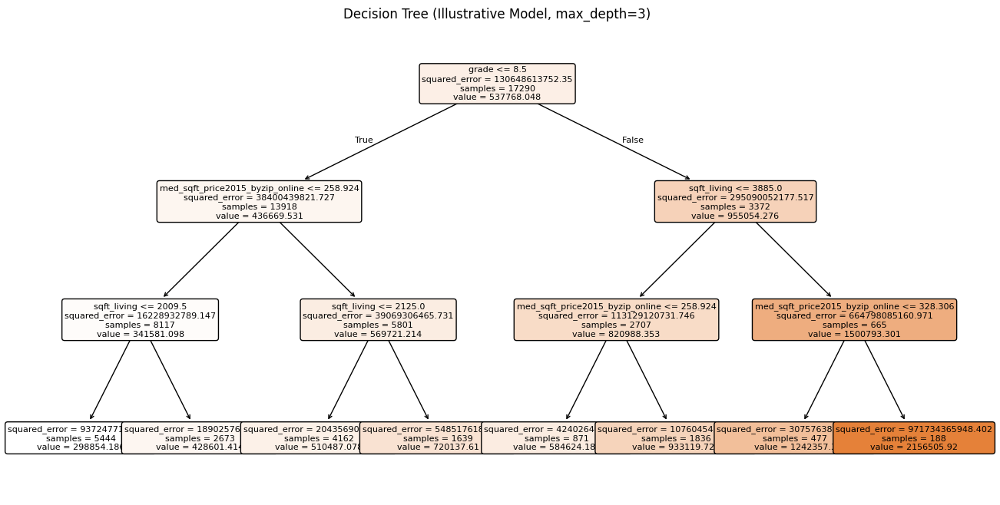

In [333]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt

# Train a small illustrative decision tree (max_depth=3)
dt_small = DecisionTreeRegressor(max_depth=3, random_state=42)
dt_small.fit(X_train, y_train)

# Retrieve feature names directly from X_train
feature_names = X_train.columns

plt.figure(figsize=(16, 8))
plot_tree(
    dt_small,
    feature_names=feature_names,
    filled=True,
    rounded=True,
    fontsize=8
)
plt.title("Decision Tree (Illustrative Model, max_depth=3)")
plt.show()

The visualisations provide complementary insights into the behaviour and interpretability of the Decision Tree model. The “True vs Predicted Prices” scatterplot shows that predictions follow the general price trend but display increasing dispersion for expensive properties, confirming that the tree struggles to model high-value homes and exhibits higher error in the upper range. The feature importance bar chart highlights that grade, living area, and the zip-level median price are by far the dominant predictors, which indicates that the tree relies heavily on structural quality and neighbourhood effects to segment the housing market. Finally, the truncated tree diagram illustrates how the model sequentially splits the data using simple threshold rules, first separating houses by grade and then refining predictions through living area or neighbourhood median price; this provides an intuitive view of how the model organizes the data, even if the full optimized tree is too deep to visualize entirely.

#**Model n°5 : Logistic Regression**

#**Model n°6 : PCA**